### This dataset is a processed version of the __YouTube Faces Dataset__, that contained short videos of celebrities that are publicly available and downloaded from YouTube.

In [1]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')
import glob

import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import matplotlib.animation as animation
import plotly.offline as py
import plotly.graph_objs as go


import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from torch import nn
import torch.optim as optim
import torch.nn.functional as F

py.init_notebook_mode(connected=True)

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# for path /content/drive/My Drive/

Mounted at /content/drive


# Load the Dataset

In [2]:
videoDF = pd.read_csv('input/youtube_faces_with_keypoints_full.csv')
videoDF.head()

,videoID,personName,imageHeight,imageWidth,videoDuration,averageFaceSize,numVideosForPerson
0,Alison_Lohman_0,Alison_Lohman,228.0,213.0,240.0,90.150000,6.0
1,Alison_Lohman_1,Alison_Lohman,248.0,201.0,79.0,108.417722,6.0
2,Alison_Lohman_2,Alison_Lohman,335.0,308.0,136.0,122.161765,6.0
3,Alison_Lohman_3,Alison_Lohman,151.0,110.0,53.0,58.000000,6.0
4,Alison_Lohman_4,Alison_Lohman,236.0,228.0,147.0,91.680272,6.0


# **Exploratory Data Analysis**:

# Dataset Overview

In [3]:
print(f"Dataset shape: {videoDF.shape}")

Dataset shape: (2194, 7)


In [4]:
videoDF.describe()

,imageHeight,imageWidth,videoDuration,averageFaceSize,numVideosForPerson
count,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000
mean,210.290337,195.633546,118.686873,94.887054,2.929809
std,64.514279,67.464967,71.806225,36.811662,0.959554
min,81.000000,74.000000,42.000000,40.220339,2.000000
25%,163.000000,147.000000,59.000000,67.337232,2.000000
50%,203.000000,185.000000,88.000000,87.578507,3.000000
75%,245.000000,234.000000,178.000000,114.550184,4.000000
max,480.000000,494.000000,240.000000,247.862745,6.000000


In [10]:
# There are no NaNs
videoDF.isna().sum()

videoID               0
personName            0
imageHeight           0
imageWidth            0
videoDuration         0
averageFaceSize       0
numVideosForPerson    0
dtype: int64

In [11]:
#Count the number of still images
print(f"Total number of frames/images: {videoDF['videoDuration'].sum():.0f}")

Total number of frames/images: 260399


In [3]:
print(f"Number of Videos: {videoDF.shape[0]}")

namelist = videoDF['personName'].unique()
categories = len(namelist)
print(f"Number of Unique Individuals: {categories}")

Number of Videos: 2194
Number of Unique Individuals: 828


In [13]:
# Number of videos per each person in dataset
videoDF.groupby(['personName'])['videoID'].count().sort_values(ascending=False)

personName
Kevin_Spacey           6
Alison_Lohman          6
Robert_F_Kennedy_Jr    6
Lauren_Hutton          6
Kim_Gandy              5
                      ..
Ham_Pong-sil           2
Zoran_Djindjic         2
Alberto_Acosta         1
Hana_Sadiq             1
Nobuyuki_Idei          1
Name: videoID, Length: 828, dtype: int64

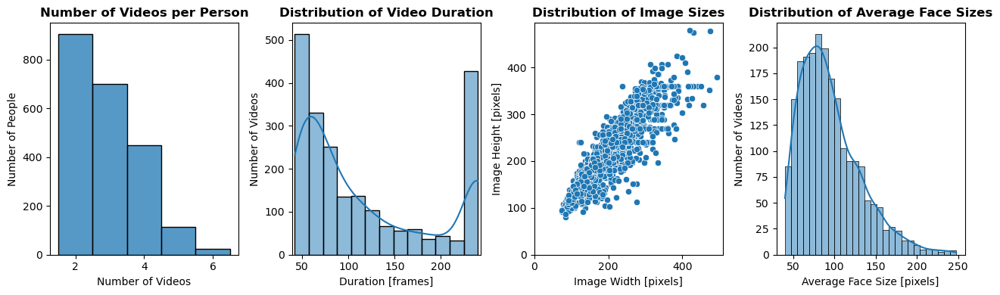

In [5]:
_, axes = plt.subplots(1, 4, figsize=(13,4))

sns.histplot(videoDF['numVideosForPerson'], bins=0.5+np.arange(videoDF['numVideosForPerson'].min()-1, videoDF['numVideosForPerson'].max()+1), ax=axes[0])
axes[0].set_title('Number of Videos per Person', fontweight='bold')
axes[0].set_xlabel('Number of Videos')
axes[0].set_ylabel('Number of People')

sns.histplot(videoDF['videoDuration'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of Video Duration', fontweight='bold')
axes[1].set_xlabel('Duration [frames]')
axes[1].set_ylabel('Number of Videos')
axes[1].set_xlim(videoDF['videoDuration'].min()-3, videoDF['videoDuration'].max()+3)

sns.scatterplot(x='imageWidth', y='imageHeight', data=videoDF, ax=axes[2])
axes[2].set_title('Distribution of Image Sizes', fontweight='bold')
axes[2].set_xlabel('Image Width [pixels]')
axes[2].set_ylabel('Image Height [pixels]')
axes[2].set_xlim(0, videoDF['imageWidth'].max()+15)
axes[2].set_ylim(0, videoDF['imageHeight'].max()+15)

sns.histplot(videoDF['averageFaceSize'], kde=True, bins=28, ax=axes[3])
axes[3].set_title('Distribution of Average Face Sizes', fontweight='bold')
axes[3].set_xlabel('Average Face Size [pixels]')
axes[3].set_ylabel('Number of Videos')

plt.tight_layout()
plt.show()

# Locate the Video Files for Use

> ### Data is provided in .npz file format, turns out it is a format belonging to numpy, allowing one to save several arrays in a single file.

In [4]:
# create array with all full file paths
npzFilesFullPath = glob.glob('input/youtube_faces_with_keypoints_full_1/youtube_faces_with_keypoints_full_1/*.npz')

npzFilesFullPath=np.append(npzFilesFullPath,glob.glob('input/youtube_faces_with_keypoints_full_2/youtube_faces_with_keypoints_full_2/*.npz'))
npzFilesFullPath=np.append(npzFilesFullPath,glob.glob('input/youtube_faces_with_keypoints_full_3/youtube_faces_with_keypoints_full_3/*.npz'))
npzFilesFullPath=np.append(npzFilesFullPath,glob.glob('input/youtube_faces_with_keypoints_full_4/youtube_faces_with_keypoints_full_4/*.npz'))

npzFilesFullPath = [path.replace('\\', '/') for path in npzFilesFullPath]

print("Example of path:")
print(npzFilesFullPath[0])

# remove the .npz file extension
videoIDs = [x.split('/')[-1].split('.')[0] for x in npzFilesFullPath]
# create a dictionary that maps videoIDs to full file paths, key is the file name in dataframe (videoID), value is the filepath
fullPaths = {}
for videoID, fullPath in zip(videoIDs, npzFilesFullPath):
    fullPaths[videoID] = fullPath

Example of path:
input/youtube_faces_with_keypoints_full_1/youtube_faces_with_keypoints_full_1/Aaron_Eckhart_0.npz


# Display some Images from the videos with 2D Keypoints overlaid

In [5]:
# show several frames from each video and overlay 2D keypoints
np.random.seed(23)
numVideos = 4
framesToShowFromVideo = np.array([0.1, 0.5, 0.9])
numFramesPerVideo = len(framesToShowFromVideo)

# select a random subset of 'numVideos' from the available videos
randVideoIDs = videoDF.loc[np.random.choice(videoDF.index, size=numVideos, replace=False), 'videoID']
print(randVideoIDs)

64        Maria_Bello_1
1457      Cheryl_Ford_4
1736    James_Wattana_3
345        JK_Rowling_3
Name: videoID, dtype: object


In [6]:
# define which points need to be connected with a line
jawPoints          = [0,17]
rigthEyebrowPoints = [17,22]
leftEyebrowPoints  = [22,27]
noseRidgePoints    = [27,31]
noseBasePoints     = [31,36]
rightEyePoints     = [36,42]
leftEyePoints      = [42,48]
outerMouthPoints   = [48,60]
innerMouthPoints   = [60,68]

listOfAllConnectedPoints = [jawPoints,rigthEyebrowPoints,leftEyebrowPoints,
                            noseRidgePoints,noseBasePoints,
                            rightEyePoints,leftEyePoints,outerMouthPoints,innerMouthPoints]

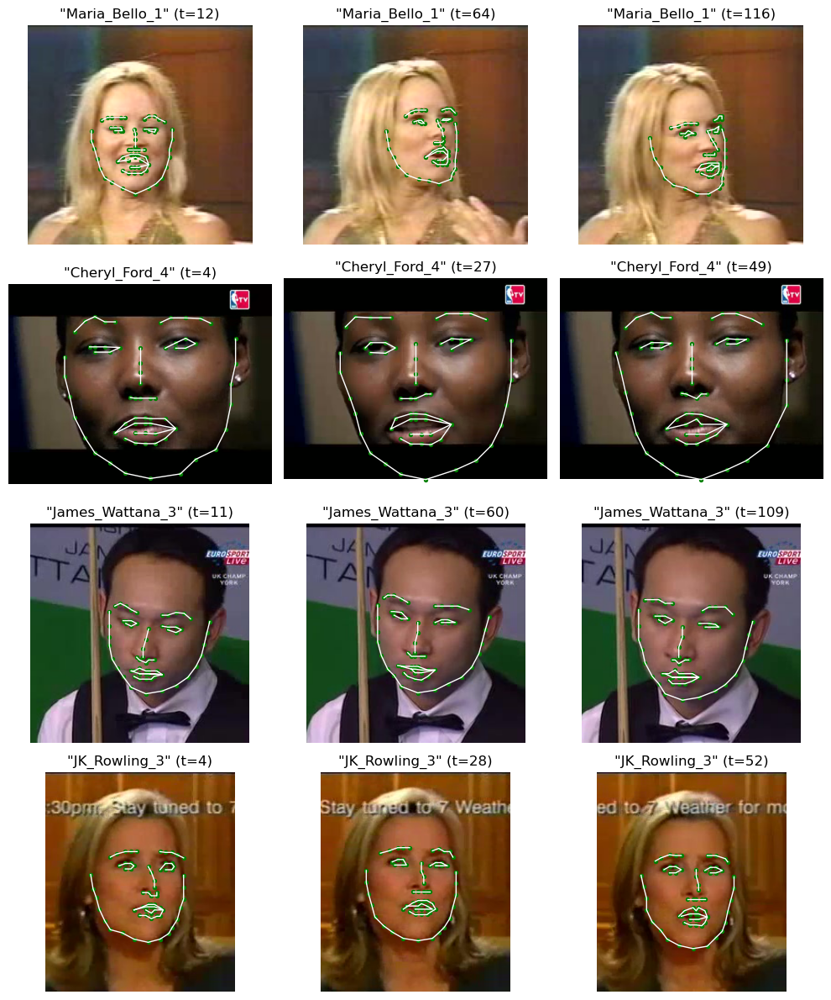

In [9]:
fig, axes = plt.subplots(nrows=numVideos, ncols=numFramesPerVideo, figsize=(10,12))

for i, videoID in enumerate(randVideoIDs):
    # load video
    videoFile = np.load(fullPaths[videoID])
    colorImages = videoFile['colorImages'] # arrays of the image colour values
    landmarks2D = videoFile['landmarks2D']

    # select frames and show their content with the landmark points
    selectedFrames = (framesToShowFromVideo * colorImages.shape[3]-1).astype(int)
    for j, frameInd in enumerate(selectedFrames):
        axes[i,j].imshow(colorImages[:,:,:,frameInd])
        axes[i,j].scatter(x=landmarks2D[:,0,frameInd], y=landmarks2D[:,1,frameInd], s=8, c='g')

        for conPts in listOfAllConnectedPoints:
            xPts = landmarks2D[conPts[0]:conPts[-1], 0, frameInd]
            yPts = landmarks2D[conPts[0]:conPts[-1], 1, frameInd]
            axes[i,j].plot(xPts, yPts, c='w', lw=1)

        axes[i,j].set_title(f'"{videoID}" (t={frameInd})')
        axes[i,j].set_axis_off()

plt.tight_layout()
plt.show()

# Show 3D Keypoints

### This package also allows you to view the facial recognition markers in 3D

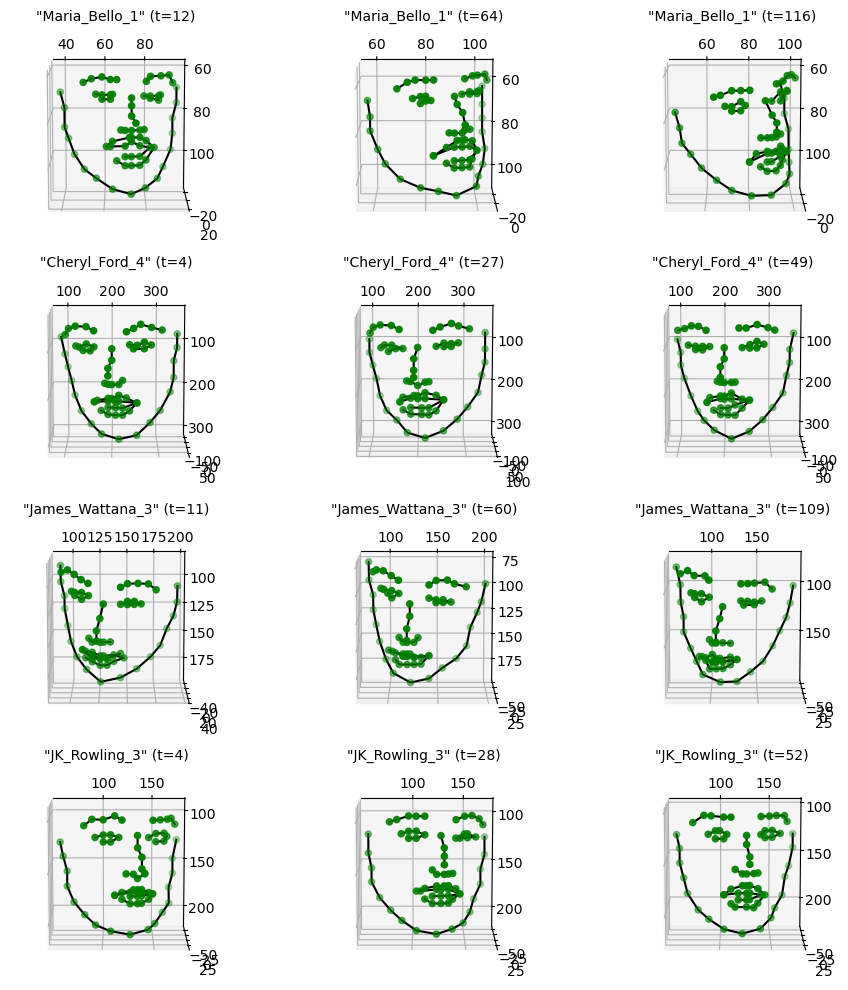

In [10]:
fig = plt.figure(figsize=(10,10))

for i, videoID in enumerate(randVideoIDs):
    # load video
    videoFile = np.load(fullPaths[videoID])
    colorImages = videoFile['colorImages'] # arrays of the image colour values
    landmarks3D = videoFile['landmarks3D']

    # select frames and show their content with the landmark points
    selectedFrames = (framesToShowFromVideo * colorImages.shape[3]-1).astype(int)

    for j, frameInd in enumerate(selectedFrames):
        subplotInd = i*numFramesPerVideo + j+1
        ax = fig.add_subplot(numVideos, numFramesPerVideo, subplotInd, projection='3d')
        ax.scatter(landmarks3D[:,0,frameInd], landmarks3D[:,1,frameInd], landmarks3D[:,2,frameInd], c='g')

        for conPts in listOfAllConnectedPoints:
            xPts = landmarks3D[conPts[0]:conPts[-1], 0, frameInd]
            yPts = landmarks3D[conPts[0]:conPts[-1], 1, frameInd]
            zPts = landmarks3D[conPts[0]:conPts[-1], 2, frameInd]
            ax.plot3D(xPts, yPts, zPts, c='black')
            ax.view_init(elev=100, azim=90)
            ax.set_xlim(ax.get_xlim()[::-1])
            ax.set_title(f'"{videoID}" (t={frameInd})', fontsize=10)

plt.tight_layout()

# Define a utility function to Create a 3D animation

#### This is essentially the same code in DrGuillermo's 3D Animation Script, only I've wrapped it with a function and added a bounding box drawing in order to avoid plotly's automatic rescaling of the axes, thus creating a contious scene and a feeling of a face moving around that scene.

In [20]:
# define a utility function to show 3D animation
def ShowAnimation_3D(landmarks3D):

    landmarks3D = landmarks3D.copy()
    landmarks3D[:,0,:] = -landmarks3D[:,0,:]

    xMin = landmarks3D[:,0,:].min()-5
    xMax = landmarks3D[:,0,:].max()+5
    yMin = landmarks3D[:,1,:].min()-5
    yMax = landmarks3D[:,1,:].max()+5
    zMin = landmarks3D[:,2,:].min()-5
    zMax = landmarks3D[:,2,:].max()+5

    boxCorners = np.array([[xMin,yMin,zMin],
                           [xMin,yMin,zMax],
                           [xMin,yMax,zMin],
                           [xMin,yMax,zMax],
                           [xMax,yMin,zMin],
                           [xMax,yMin,zMax],
                           [xMax,yMax,zMin],
                           [xMax,yMax,zMax]])

    traversalOrder = [0,1,3,2,0,4,6,2,6,7,3,7,5,1,5,4]
    boxTraceCoords = np.zeros((len(traversalOrder),3))
    for i, corner in enumerate(traversalOrder):
        boxTraceCoords[i,:] = boxCorners[corner,:]

    trace1   = go.Scatter3d(name='Jawline', x=landmarks3D[:,0,1][0:17],y=landmarks3D[:,1,1][0:17],z=landmarks3D[:,2,1][0:17],
                            mode='lines+markers',marker=dict(color = 'blue',opacity=0.7,size = 5))

    trace2   = go.Scatter3d(name='Right Eyebrow',x=landmarks3D[:,0,1][17:22],y=landmarks3D[:,1,1][17:22],z=landmarks3D[:,2,1][17:22],
                            mode='lines+markers',marker=dict(color = 'blue',opacity=0.7,size = 5))

    trace3   = go.Scatter3d(name='Left Eyebrow',x=landmarks3D[:,0,1][22:27],y=landmarks3D[:,1,1][22:27],z=landmarks3D[:,2,1][22:27],
                            mode='lines+markers',marker=dict(color = 'blue',opacity=0.7,size = 5))

    trace4   = go.Scatter3d(name='Nose Ridge',x=landmarks3D[:,0,1][27:31],y=landmarks3D[:,1,1][27:31],z=landmarks3D[:,2,1][27:31],
                            mode='lines+markers',marker=dict(color = 'green',opacity=0.6,size = 5))

    trace5   = go.Scatter3d(name='Nose Base',x=landmarks3D[:,0,1][31:36],y=landmarks3D[:,1,1][31:36],z=landmarks3D[:,2,1][31:36],
                            mode='lines+markers',marker=dict(color = 'green',opacity=0.6,size = 5))

    trace6   = go.Scatter3d(name='Right Eye', x=landmarks3D[:,0,1][36:42],y=landmarks3D[:,1,1][36:42],z=landmarks3D[:,2,1][36:42],
                            mode='lines+markers',marker=dict(color = 'green',opacity=0.6,size = 5))

    trace7   = go.Scatter3d(name='Left Eye', x=landmarks3D[:,0,1][42:48],y=landmarks3D[:,1,1][42:48],z=landmarks3D[:,2,1][42:48],
                            mode='lines+markers',marker=dict(color = 'green',opacity=0.6,size = 5))

    trace8   = go.Scatter3d(name='Outer Mouth', x=landmarks3D[:,0,1][48:60],y=landmarks3D[:,1,1][48:60],z=landmarks3D[:,2,1][48:60],
                            mode='lines+markers',marker=dict(color = 'green',opacity=0.6,size = 5))

    trace9   = go.Scatter3d(name='Inner Mouth', x=landmarks3D[:,0,1][60:68],y=landmarks3D[:,1,1][60:68],z=landmarks3D[:,2,1][60:68],
                            mode='lines+markers',marker=dict(color = 'green',opacity=0.6,size = 5))

    boxTrace = go.Scatter3d(name='boundingBox', x=boxTraceCoords[:,0],y=boxTraceCoords[:,1],z=boxTraceCoords[:,2],
                            mode='lines+markers',marker=dict(color = 'red', opacity=1.0,size = 5))

    data = [trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8, trace9, boxTrace]

    mfr = []
    for t in range(len(landmarks3D[1,1,:])):
        mfr.append({'data' :[{'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][ 0:17],'y':landmarks3D[:,1,t][0:17],'z':landmarks3D[:,2,t][ 0:17]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][17:22],'y':landmarks3D[:,1,t][17:22],'z':landmarks3D[:,2,t][17:22]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][22:27],'y':landmarks3D[:,1,t][22:27],'z':landmarks3D[:,2,t][22:27]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][27:31],'y':landmarks3D[:,1,t][27:31],'z':landmarks3D[:,2,t][27:31]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][31:36],'y':landmarks3D[:,1,t][31:36],'z':landmarks3D[:,2,t][31:36]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][36:42],'y':landmarks3D[:,1,t][36:42],'z':landmarks3D[:,2,t][36:42]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][42:48],'y':landmarks3D[:,1,t][42:48],'z':landmarks3D[:,2,t][42:48]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][48:60],'y':landmarks3D[:,1,t][48:60],'z':landmarks3D[:,2,t][48:60]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                              'x':landmarks3D[:,0,t][60:68],'y':landmarks3D[:,1,t][60:68],'z':landmarks3D[:,2,t][60:68]},
                             {'type' : "scatter3d",'mode':'lines+markers',
                             'x':boxTraceCoords[:,0],'y':boxTraceCoords[:,1],'z':boxTraceCoords[:,2]}]})


    layout = go.Layout(width=800, height=800, title='3D Face Shape Animation',
                       scene=dict(camera=dict(up     = dict(x= 0, y=-1.0, z=0),
                                              center = dict(x= 0, y= 0.0, z=0),
                                              eye    = dict(x= 0, y= 0.7, z=2),
                                             )
                                 ),
                        updatemenus=[dict(type='buttons', showactive=False,
                                            y=1,
                                            x=1,
                                            xanchor='right',
                                            yanchor='top',
                                            pad=dict(t=0, r=10),
                                            buttons=[dict(
                                                        label='Play Animation',
                                                        method='animate',
                                                        args=[None, dict(frame       = dict(duration=0.04, redraw=True),
                                                                         transition  = dict(duration=0),
                                                                         fromcurrent = True,
                                                                         mode = 'immediate'
                                                                        )
                                                             ]
                                                         )
                                                    ]
                                           )
                                      ]
                      )

    fig = dict(data=data, layout=layout, frames=mfr)
    py.iplot(fig)

# Load a Video and Present it's 3D keypoint Animation

### Press the "Play Animation" button to play a nice and fast animation, don't wait for the automatic animation to finish (it's too slow)

In [21]:
# load a 3D landmarks sequence and present it
personToUse = 'Maria_Bello_1'
videoFile = np.load(fullPaths[personToUse])
landmarks3D_curr = videoFile['landmarks3D']

ShowAnimation_3D(landmarks3D_curr)

# Normalize 2D and 3D shapes

### Collect all 2D and 3D shapes from all frames from all videos to a single numpy array matrix

In [7]:
# total number of frames
totalNumberOfFrames = videoDF['videoDuration'].sum().astype(int)
print(f'Total number of frames in dataset: {totalNumberOfFrames}')

#Initialize arrarys for the landmark points for each frame in the dataset
landmarks2D_all = np.zeros((68, 2, totalNumberOfFrames))
landmarks3D_all = np.zeros((68, 3, totalNumberOfFrames))


shapeIndToVideoID = {} # dictionary for later usage
# it will look like this - {shapeInd: (videoID, frameInd)}

endInd = 0

# Add the frames to the arrays
for i, videoID in enumerate(videoDF['videoID']):

    # load video
    videoFile = np.load(fullPaths[videoID])
    landmarks2D = videoFile['landmarks2D']
    landmarks3D = videoFile['landmarks3D']

    startInd = endInd
    endInd = startInd + landmarks2D.shape[2]

    # store in one big array
    landmarks2D_all[:,:,startInd:endInd] = landmarks2D
    landmarks3D_all[:,:,startInd:endInd] = landmarks3D

    # make sure we keep track of the mapping to the original video and frame
    for videoFrameInd, shapeInd in enumerate(range(startInd,endInd)):
        shapeIndToVideoID[shapeInd] = (videoID, videoFrameInd)

print(landmarks2D_all.shape)
print(landmarks3D_all.shape)

Total number of frames in dataset: 260399
(68, 2, 260399)
(68, 3, 260399)


### Normalize the landmarks so they can be compared

In [8]:
# center the shapes around zero
# i.e. such that for each frame the mean x,y,z coordinates will be zero
# or in math terms: Xc = X - mean(X), Yc = Y - mean(Y), Zc = Z - mean(Z)
landmarks2D_centered = np.zeros(landmarks2D_all.shape)
landmarks2D_centered = landmarks2D_all - np.tile(landmarks2D_all.mean(axis=0), [68,1,1])

landmarks3D_centered = np.zeros(landmarks3D_all.shape)
landmarks3D_centered = landmarks3D_all - np.tile(landmarks3D_all.mean(axis=0), [68,1,1])

# normalize the shapes such that they have the same scale
# i.e. such that for each frame the mean euclidian distance from the shape center will be one
# or in math terms: mean( sqrt(dX^2 + dY^2 + dZ^2) ) = 1
landmarks2D_normalized = np.zeros(landmarks2D_all.shape)
landmarks2D_normalized = landmarks2D_centered / np.tile((np.sqrt((landmarks2D_centered**2).sum(axis=1))).mean(axis=0), [68,2,1])

landmarks3D_normalized = np.zeros(landmarks3D_all.shape)
landmarks3D_normalized = landmarks3D_centered / np.tile((np.sqrt((landmarks3D_centered**2).sum(axis=1))).mean(axis=0), [68,3,1])

# Visualize 2D Shape Normalization stages

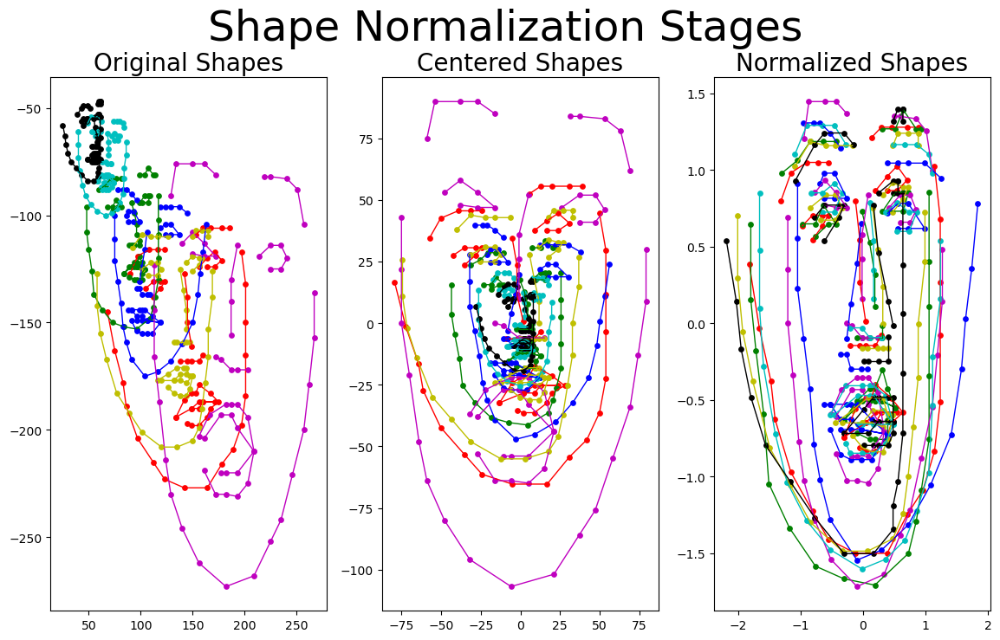

In [9]:
# check the 2D normalization and verify that everything is as expected
# select random several frames to be used as test cases
np.random.seed(23)

listOfShapeColors = ['r','g','b','m','y','c','k']
numShapesToPresent = len(listOfShapeColors)
listOfShapeInds = np.random.choice(range(int(totalNumberOfFrames)), size=numShapesToPresent, replace=False)

plt.figure(figsize=(14,8))
plt.suptitle('Shape Normalization Stages',fontsize=35) # main figure box setup and title

# original shapes
plt.subplot(1,3,1)
for i, shapeInd in enumerate(listOfShapeInds):
    plt.scatter(landmarks2D_all[:,0,shapeInd], -landmarks2D_all[:,1,shapeInd], s=15, c=listOfShapeColors[i])
    for conPts in listOfAllConnectedPoints:
        xPts = landmarks2D_all[conPts[0]:conPts[-1],0,shapeInd]
        yPts = -landmarks2D_all[conPts[0]:conPts[-1],1,shapeInd]
        plt.plot(xPts, yPts, c=listOfShapeColors[i], lw=1)
# plt.axis('off')
plt.title('Original Shapes', fontsize=20)

# centered shapes
plt.subplot(1,3,2)
for i, shapeInd in enumerate(listOfShapeInds):
    plt.scatter(landmarks2D_centered[:,0,shapeInd], -landmarks2D_centered[:,1,shapeInd], s=15, c=listOfShapeColors[i])
    for conPts in listOfAllConnectedPoints:
        xPts = landmarks2D_centered[conPts[0]:conPts[-1],0,shapeInd]
        yPts = -landmarks2D_centered[conPts[0]:conPts[-1],1,shapeInd]
        plt.plot(xPts, yPts, c=listOfShapeColors[i], lw=1)
# plt.axis('off')
plt.title('Centered Shapes', fontsize=20)

# normalized shapes
plt.subplot(1,3,3)
for i, shapeInd in enumerate(listOfShapeInds):
    plt.scatter(landmarks2D_normalized[:,0,shapeInd], -landmarks2D_normalized[:,1,shapeInd], s=15, c=listOfShapeColors[i])
    for conPts in listOfAllConnectedPoints:
        xPts = landmarks2D_normalized[conPts[0]:conPts[-1],0,shapeInd]
        yPts = -landmarks2D_normalized[conPts[0]:conPts[-1],1,shapeInd]
        plt.plot(xPts, yPts, c=listOfShapeColors[i], lw=1)
# plt.axis('off')
plt.title('Normalized Shapes', fontsize=20)
plt.show()

# Perform Cluster Analysis using Kmeans

### We are going to use the landmarked points on each of the still frames to try to create clusters of unique individuals.

In [10]:
# Check the shape of our input array
landmarks2D_normalized.shape

(68, 2, 260399)

In [11]:
# Reshape 2D landmarks up to 2 columns and 3D landmarks for further usage
normalizedShapesTable2D = np.reshape(landmarks2D_normalized, [68*2, landmarks2D_normalized.shape[2]]).T
normalizedShapesTable3D = np.reshape(landmarks3D_normalized, [68*3, landmarks3D_normalized.shape[2]]).T

normalizedShapesTable2D.shape, normalizedShapesTable3D.shape

((260399, 136), (260399, 204))

In [28]:
# cluster normalized shapes using Kmeans
elbow_scores = []

for numClusters in range(1,16):
    Kmeans = KMeans(n_clusters=numClusters, n_init=5, random_state=26)
    shapesModel = Kmeans.fit(normalizedShapesTable2D[::2,:])
    clusterAssignment = Kmeans.predict(normalizedShapesTable2D)

    # Calculating the elbow metric
    elbow_scores.append(shapesModel.inertia_) # Sum of squared distances of samples to their closest cluster center

### Plot the scores to utilize the "Elbow Method" to locate the optimum

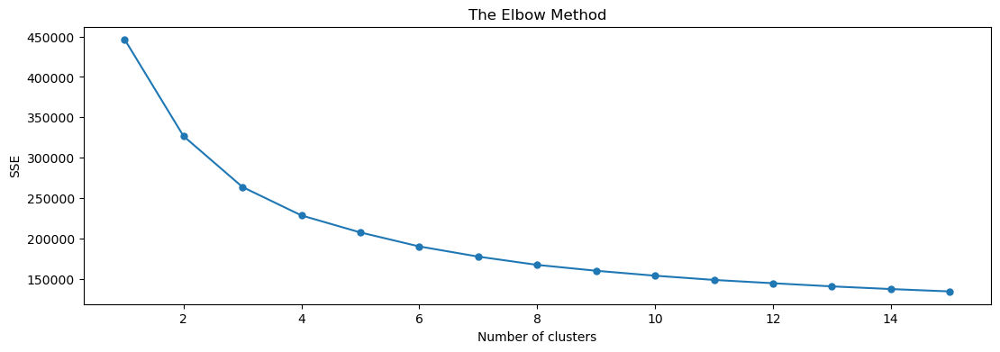

In [29]:
# Plotting the elbow method
plt.figure(figsize=(13,4))
plt.plot(range(1,16), elbow_scores, marker='.', markersize=10)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSE') # Sum of squared distances
plt.show()

### This analysis is interesting because it suggests that the optimum number of clusters is around 6. But we have many unique people in the dataset.
### What's going on? Let's take a look at the clusters:

In [30]:
# run the model for the preferred number of clusters
numClusters = 6
Kmeans = KMeans(n_clusters=numClusters, n_init=5, random_state=26)
shapesModel = Kmeans.fit(normalizedShapesTable2D[::2,:])
clusterAssignment = shapesModel.predict(normalizedShapesTable2D)

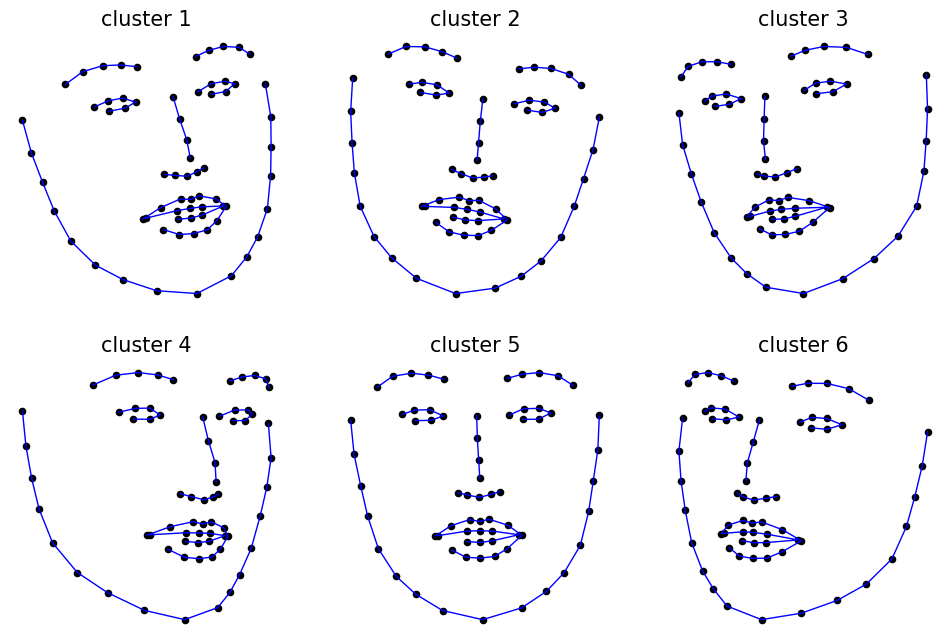

In [31]:
plt.figure(figsize=(12,12))
numRowsAndCols = int(np.ceil(np.sqrt(numClusters)))

for i in range(numClusters):
    plt.subplot(numRowsAndCols,numRowsAndCols,i+1)
    currClusterShape = np.reshape(shapesModel.cluster_centers_[i,:], [68,2])
    plt.scatter(x=currClusterShape[:,0],y=-currClusterShape[:,1],s=20,c='black')

    for conPts in listOfAllConnectedPoints:
        xPts =  currClusterShape[conPts[0]:conPts[-1],0]
        yPts = -currClusterShape[conPts[0]:conPts[-1],1]
        plt.plot(xPts,yPts,c='b',lw=1)

    plt.title('cluster %d' %(i+1),fontsize=15)
    plt.axis('off')

### Cluster 1: Crooked mouth and Look to the Right

In [32]:
# show several original images that are assigned to a particular cluster
selectedCluster = 0
numRows = 4
numCols = 4

# select the examples indexes of assigned cluster
shapeIndsAssignedToCluster = np.nonzero(clusterAssignment == selectedCluster)[0]

# randomly select images to dispaly
listOfShapeInds = np.random.choice(shapeIndsAssignedToCluster, size=numRows*numCols, replace=False)
print(f"Randomly selected indexes: {listOfShapeInds}")

Randomly selected indexes: [239382 207896 112100 211936 227122 164701 150006  19987 214154  28772
  61043  95807 168841 211531 160996  16763]


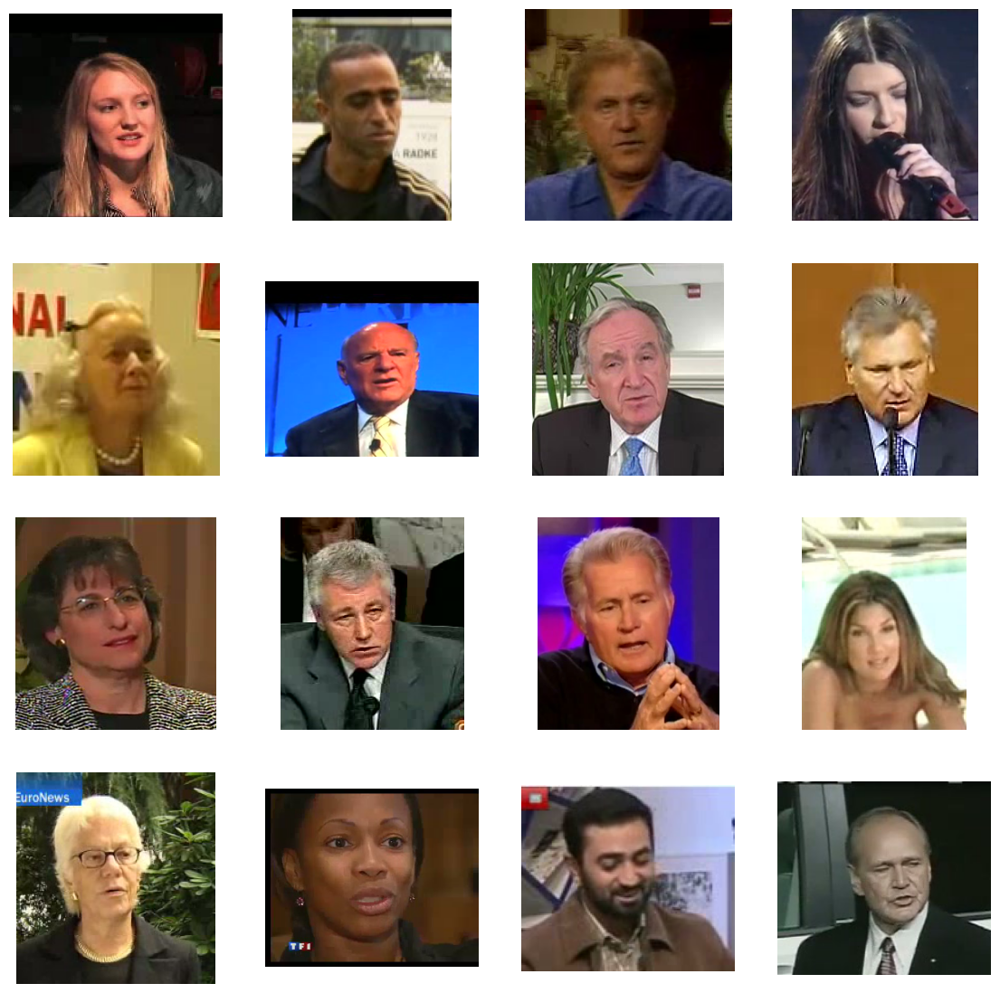

In [33]:
plt.figure(figsize=(14,14))
for i, shapeInd in enumerate(listOfShapeInds):
    # load video and select the relevent frame
    videoID = shapeIndToVideoID[shapeInd][0]
    frameInd = shapeIndToVideoID[shapeInd][1]
    videoFile = np.load(fullPaths[videoID])
    image = videoFile['colorImages'][:,:,:,frameInd]

    # show the image
    plt.subplot(numRows, numCols, i+1)
    plt.imshow(image)
    plt.axis('off')

### Cluster 5: Look straight ahead

In [34]:
# show several original images that are assigned to a particular cluster
selectedCluster = 4
numRows = 4
numCols = 4

# select the examples indexes of assigned cluster
shapeIndsAssignedToCluster = np.nonzero(clusterAssignment == selectedCluster)[0]

# randomly select images to dispaly
listOfShapeInds = np.random.choice(shapeIndsAssignedToCluster, size=numRows*numCols, replace=False)
print(f"Randomly selected indexes: {listOfShapeInds}")

Randomly selected indexes: [ 71020 111018  38242 152080 251464  44872 229330 190738 120487 183939
  33261  25111   1538 210530 138916 132000]


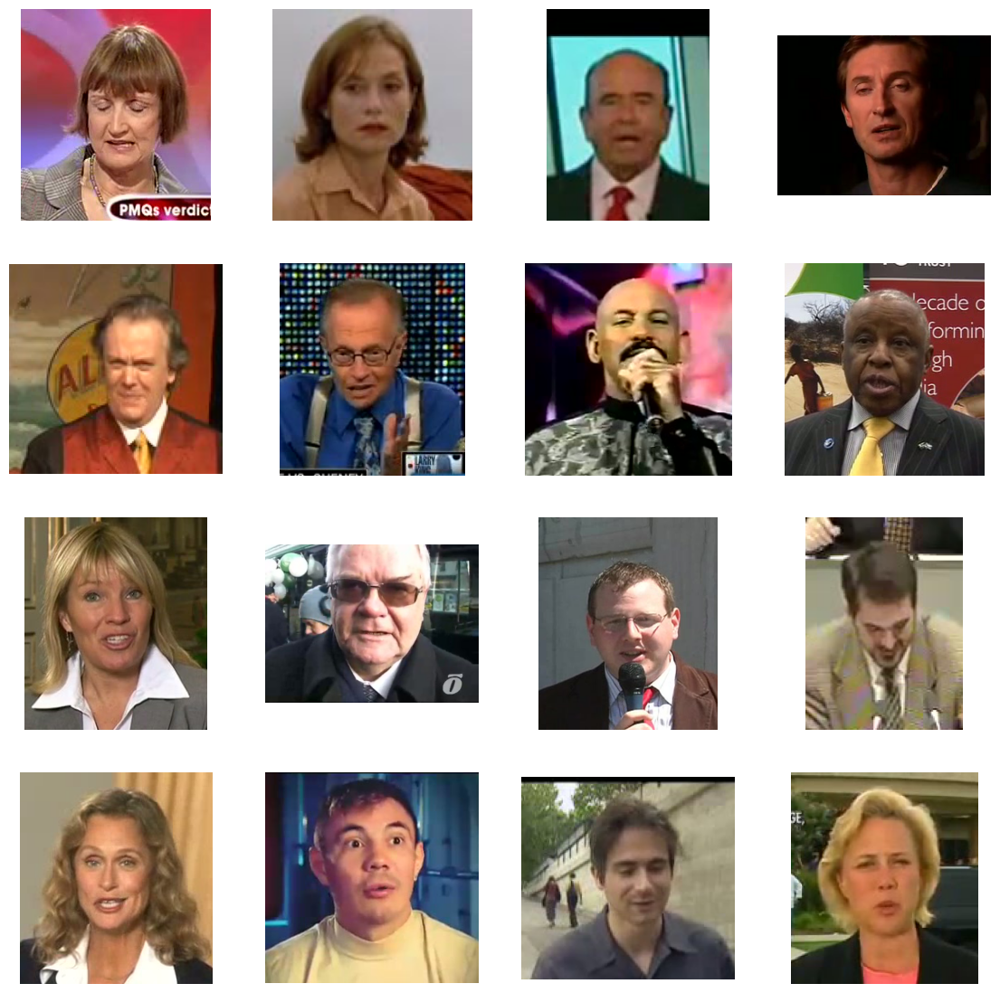

In [35]:
plt.figure(figsize=(14,14))
for i, shapeInd in enumerate(listOfShapeInds):
    # load video and select the relevent frame
    videoID = shapeIndToVideoID[shapeInd][0]
    frameInd = shapeIndToVideoID[shapeInd][1]
    videoFile = np.load(fullPaths[videoID])
    image = videoFile['colorImages'][:,:,:,frameInd]

    # show the image
    plt.subplot(numRows, numCols, i+1)
    plt.imshow(image)
    plt.axis('off')

### Cluster 6: Look left

In [36]:
selectedCluster = 5

# select the examples indexes of assigned cluster
shapeIndsAssignedToCluster = np.nonzero(clusterAssignment == selectedCluster)[0]

# randomly select images to dispaly
listOfShapeInds = np.random.choice(shapeIndsAssignedToCluster, size=numRows*numCols, replace=False)
print(f"Randomly selected indexes: {listOfShapeInds}")

Randomly selected indexes: [ 21924   9374  40500 167177 189004 182599 156742  42142 131438 126212
 257730 167921  87684  87115  72064 225876]


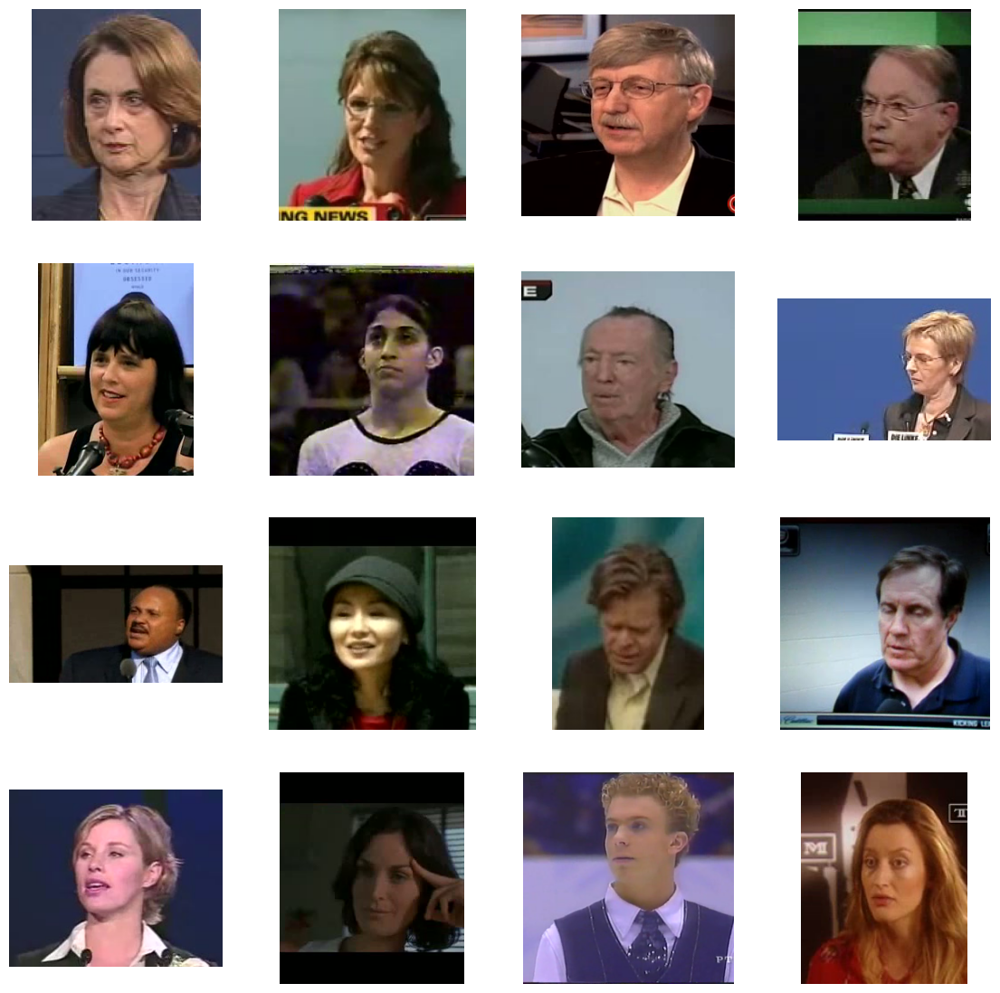

In [37]:
plt.figure(figsize=(14,14))

for i, shapeInd in enumerate(listOfShapeInds):
    # load video and select the relevent frame
    videoID = shapeIndToVideoID[shapeInd][0]
    frameInd = shapeIndToVideoID[shapeInd][1]
    videoFile = np.load(fullPaths[videoID])
    image = videoFile['colorImages'][:,:,:,frameInd]

    # show the image
    plt.subplot(numRows, numCols, i+1)
    plt.imshow(image)
    plt.axis('off')

### So great, we can cluster the faces into groups with certain facial expressions or looking into specific directions.

### But can we group them by the same person?
### Let's generate a model with the number of people included in the samples and see if we can group by person, in this case, 828 clusters!!!

In [42]:
# run the model for the preferred number of clusters
numClusters = categories
normalizedShapesTable = np.reshape(landmarks2D_normalized, [68*2, landmarks2D_normalized.shape[2]]).T

shapesModel = KMeans(n_clusters=numClusters, n_init=5, random_state=1).fit(normalizedShapesTable[::2,:])
clusterAssignment = shapesModel.predict(normalizedShapesTable)

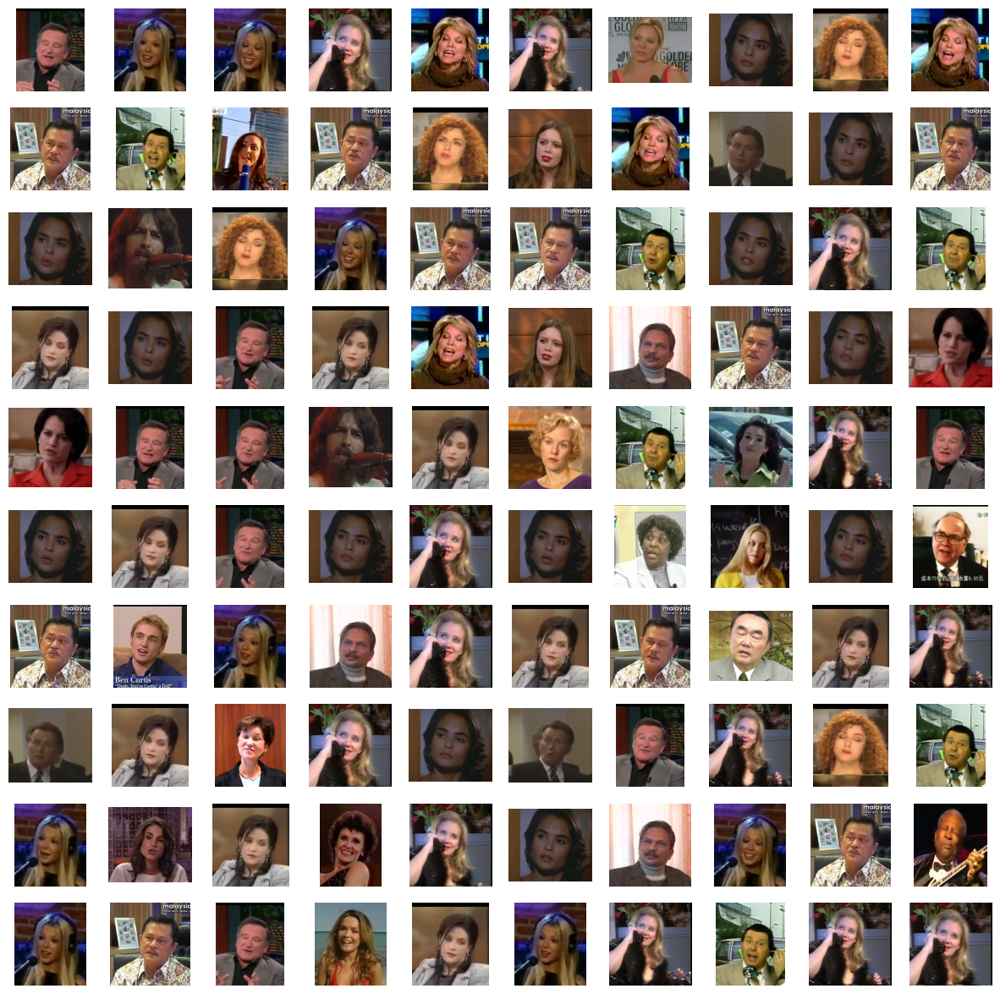

In [43]:
selectedCluster = 19
numRows = 10
numCols = 10

shapeIndsAssignedToCluster = np.nonzero(clusterAssignment == selectedCluster)[0]
listOfShapeInds = np.random.choice(shapeIndsAssignedToCluster ,size=numRows*numCols,replace=False)

plt.figure(figsize=(15,15))
for i, shapeInd in enumerate(listOfShapeInds):
    # load video and pickout the relevent frame
    videoID  = shapeIndToVideoID[shapeInd][0]
    frameInd = shapeIndToVideoID[shapeInd][1]    
    videoFile = np.load(fullPaths[videoID])
    image = videoFile['colorImages'][:,:,:,frameInd]
    
    # show the image
    plt.subplot(numRows,numCols,i+1)
    plt.imshow(image)
    plt.axis('off')

### Really poor performance in case of grouping by people

# Create a dataframe to store labels based on the images

In [12]:
# Encode the names of the people into a digital number so that we can compare results
le = LabelEncoder()
videoDF['person'] = le.fit_transform(videoDF['personName'])

personList = videoDF['person'].unique()

videoDF.tail()

,videoID,personName,imageHeight,imageWidth,videoDuration,averageFaceSize,numVideosForPerson,person
2189,Yossi_Beilin_3,Yossi_Beilin,240.0,243.0,240.0,110.258333,2.0,822
2190,Zahir_Shah_0,Zahir_Shah,196.0,200.0,143.0,93.944056,2.0,824
2191,Zahir_Shah_1,Zahir_Shah,240.0,293.0,240.0,155.495833,2.0,824
2192,Zoran_Djindjic_0,Zoran_Djindjic,230.0,237.0,240.0,98.908333,2.0,827
2193,Zoran_Djindjic_2,Zoran_Djindjic,131.0,115.0,240.0,59.554167,2.0,827


In [45]:
# create dataframe to store labels
dfExpanded = []
dfExpanded = pd.DataFrame(columns=['videoIDexpanded', 'frameNum', 'actualName'])

In [ ]:
start = 0
numRows = len(videoDF.index)

# iterate through each row in videoDF to extract video ID, number of frames and person encoded label
for row in range(0, numRows):
    ID = videoDF['videoID'][row]
    frames = int(videoDF['videoDuration'][row])
    person_encode = int(videoDF['person'][row])

    # iterate through each individual frame in current video
    for individual_frame in range(0, frames):
        dfExpanded.at[start + individual_frame, 'videoIDexpanded'] = ID # assign videoID to the corresponding frame in dfExpanded
        dfExpanded.at[start + individual_frame, 'frameNum'] = int(individual_frame) # assign frame number to the corresponding frame in dfExpanded
        dfExpanded.at[start + individual_frame, 'actualName'] = person_encode # assign person encoded label to the corresponding frame in dfExpanded

    start = start + frames

In [46]:
# Write the newly created feature and target dataframe to .csv for easier reading
save_path = 'dfExpanded.csv'

# Write the newly created feature and target dataframe to .csv for easier reading
dfExpanded.to_csv(save_path, index=None, header=True)

In [13]:
# load the dfExpanded
dfExpanded = pd.read_csv('dfExpanded.csv')

dfExpanded

,videoIDexpanded,frameNum,actualName
0,Alison_Lohman_0,0,45
1,Alison_Lohman_0,1,45
2,Alison_Lohman_0,2,45
3,Alison_Lohman_0,3,45
4,Alison_Lohman_0,4,45
...,...,...,...
260394,Zoran_Djindjic_2,235,827
260395,Zoran_Djindjic_2,236,827
260396,Zoran_Djindjic_2,237,827
260397,Zoran_Djindjic_2,238,827


# Classification Analysis

### In this section, we will create a dataframe of features to use in classification regressions. The dataframe consists of columns each holding one of the cordinates (x then y) for each of the landmarks points.

### The idea is that the unique patterns of the coordinates will distinguish individual people because the relationship (weights) between all the points are unique for each individual regardless of the expression or the direction they are looking.

In [14]:
X_2D = normalizedShapesTable2D
X_3D = normalizedShapesTable3D # for further usage

In [15]:
y_encoded = pd.get_dummies(dfExpanded['actualName']).values  # for Neural Network
y_class = dfExpanded.iloc[:,2].values.astype('int')  # for classical models

### Train / test splitting

In [16]:
random_state = 26

In [17]:
# Split into train and test
X_temp, X_test, y_temp, y_test_class = train_test_split(X_2D, y_class, test_size=0.15, random_state=random_state)
# Additional split into train and test
X_train, X_val, y_train_class, y_val_class = train_test_split(X_temp, y_temp, test_size=0.176, random_state=random_state)

print(f"X_train size: {X_train.shape}, X_val size: {X_val.shape}, X_test size: {X_test.shape}")
print(f"y_train size: {y_train_class.shape}, y_val size: {y_val_class.shape}, y_test size: {y_test_class.shape}")

X_train size: (182383, 136), X_val size: (38956, 136), X_test size: (39060, 136)
y_train size: (182383,), y_val size: (38956,), y_test size: (39060,)


In [27]:
# Create a list of the models to be run
models=[("LR", LogisticRegression()), ("DTC", DecisionTreeClassifier()),
        ("KNC", KNeighborsClassifier()), ("GNB", GaussianNB()),
        ("RFC", RandomForestClassifier())]

* ### Logistic Regression

In [28]:
LR =LogisticRegression(multi_class='multinomial')
print('LR model created')

LR.fit(X_train, y_train_class)
print('LR model fitted')

predictionsLR_val= LR.predict(X_val)
f1LR_val=f1_score(y_val_class, predictionsLR_val, average='weighted')

predictionsLR= LR.predict(X_test)
f1LR=f1_score(y_test_class, predictionsLR, average='weighted')

print(f"F1 val: {f1LR_val}, F1 test: {f1LR}")

LR model created
LR model fitted
F1 val: 0.20337027946067524, F1 test: 0.20715081193818963


* ### Decision Tree

In [29]:
DTC = DecisionTreeClassifier()
print('DTC model created')

DTC.fit(X_train, y_train_class)
print('DTC model fitted')

predictionsDTC_val = DTC.predict(X_val)
f1DTC_val = f1_score(y_val_class, predictionsDTC_val, average='weighted')

predictionsDTC= DTC.predict(X_test)
f1DTC=f1_score(y_test_class, predictionsDTC, average='weighted')

print(f"F1 val: {f1DTC_val}, F1 test: {f1DTC}")

DTC model created
DTC model fitted
F1 val: 0.48990385059586494, F1 test: 0.48892620837435313


* ### K-Mean Nearest Neighbours

In [31]:
knn = KNeighborsClassifier(n_neighbors=1)
print('KNN model created')

knn.fit(X_train, y_train_class)
print('KNN model fitted')

predictionsKNC_val = knn.predict(X_val)
f1KNC_val = f1_score(y_val_class, predictionsKNC_val, average='weighted')

predictionsKNN= knn.predict(X_test)
f1KNC=f1_score(y_test_class, predictionsKNN, average='weighted')

print(f"F1 val: {f1KNC_val}, F1 test: {f1KNC}")

KNN model created
KNN model fitted
F1 val: 0.9245075764424509, F1 test: 0.9252215248128791


* ### Gaussian Naive Bayes (GNB)

In [32]:
GNB =GaussianNB()
print('GNB model created')

GNB.fit(X_train, y_train_class)
print('GNB model fitted')

predictionsGNB_val = GNB.predict(X_val)
f1GNB_val = f1_score(y_val_class, predictionsGNB_val, average='weighted')

predictionsGNB= GNB.predict(X_test)
f1GNB =f1_score(y_test_class, predictionsGNB, average='weighted')

print(f"F1 val: {f1GNB_val}, F1 test: {f1GNB}")

GNB model created
GNB model fitted
F1 val: 0.11820721665960324, F1 test: 0.12007502201035038


* ### Random Forest (RFC)

In [42]:
RFC =RandomForestClassifier()
print('RFC model created')

RFC.fit(X_train, y_train_class)
print('RFC model fitted')

predictionsRFC_val = RFC.predict(X_val)
f1RFC_val = f1_score(y_val_class, predictionsRFC_val, average='weighted')

predictionsRFC = RFC.predict(X_test)
f1RFC = f1_score(y_test_class, predictionsRFC, average='weighted')

print(f"F1 val: {f1RFC_val}, F1 test: {f1RFC}")

### Save and display the results of the Classification and Clustering

In [40]:
# List of all methods used in comparison
modelList=["LR","Desicion Tree","KNN","GNB","Random Forest"]
LR = 0.20715081193818963
DTC = 0.48892620837435313
KNC = 0.9252215248128791
GNB = 0.12007502201035038
RFC = 0.6860246850089998

# Create a list with the scores with each of the methods in this notebook
allScores = [f1LR, f1DTC, f1KNC, f1GNB, RFC]

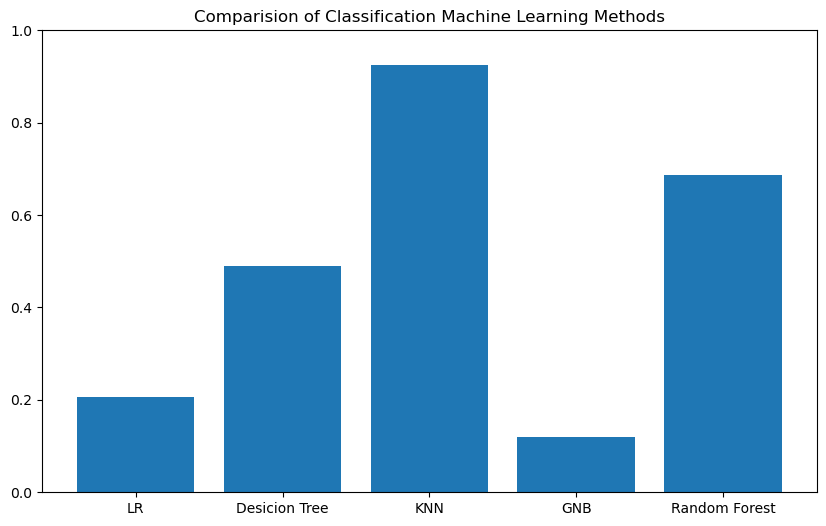

In [41]:
plt.figure(figsize=(10,6))
plt.bar(modelList,allScores)
plt.title('Comparision of Classification Machine Learning Methods')
plt.ylim(0,1)
plt.show()

# Create training and testing sets for the 2D landmarking points.
### No further transformation or scaling is needed as the data is scaled and centered above.

### We are going to use the landmarked points on each of the still frames for each video to create a model to recognize similar faces.The Landmark points transformed into a single order of values will be our feature column, and the encoded person labels will be our target.

### A further investigation could look at modelling the ability to predict based on individual arrangements of different parts of the face by looking at a subset of the landmark points.

In [18]:
# Split into train and test for neural networks
X_temp, X_test, y_temp, y_test_encoded = train_test_split(X_2D, y_encoded, test_size=0.15, random_state=random_state)
X_train, X_val, y_train_encoded, y_val_encoded = train_test_split(X_temp, y_temp, test_size=0.176, random_state=random_state)

print(f"X_train size: {X_train.shape}, X_val size: {X_val.shape}, X_test size: {X_test.shape}")
print(f"y_train size: {y_train_encoded.shape}, y_val size: {y_val_encoded.shape}, y_test size: {y_test_encoded.shape}")

X_train size: (182383, 136), X_val size: (38956, 136), X_test size: (39060, 136)
y_train size: (182383, 828), y_val size: (38956, 828), y_test size: (39060, 828)


> ### Our target is the labelled person for each still frame in the videos and we use target as encoded categories

# Neural Network

### Convert to Tensors

In [19]:
X_train2D = torch.tensor(X_train, dtype=torch.float32)
X_val2D = torch.tensor(X_val, dtype=torch.float32)
X_test2D = torch.tensor(X_test, dtype=torch.float32)

y_train = torch.tensor(y_train_encoded, dtype=torch.float32)
y_val = torch.tensor(y_val_encoded, dtype=torch.float32)
y_test = torch.tensor(y_test_encoded, dtype=torch.float32)

### CustomDataset

In [20]:
class CustomDataset(Dataset):
    def __init__(self, features, labels):
        self.features = features
        self.labels = labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

### Create Datasets and Dataloaders

In [21]:
train_dataset = CustomDataset(X_train2D, y_train)
val_dataset = CustomDataset(X_val2D, y_val)
test_dataset = CustomDataset(X_test2D, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

### Architecture

In [49]:
class NeuralNet(nn.Module):
    def __init__(self):
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(X_train2D.shape[1], 300)
        self.bn1 = nn.BatchNorm1d(300)
        self.fc2 = nn.Linear(300, 490)
        self.bn2 = nn.BatchNorm1d(490)
        self.fc3 = nn.Linear(490, 440)
        self.bn3 = nn.BatchNorm1d(440)
        self.fc4 = nn.Linear(440, 380)
        self.bn4 = nn.BatchNorm1d(380)
        self.output_layer = nn.Linear(380, y_train.shape[1])

        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.15)


    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.dropout(x)
        x = self.relu(self.bn4(self.fc4(x)))
        x = self.output_layer(x)
        return x

### Parameters

In [50]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

model = NeuralNet().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

Using device: cuda


In [51]:
# move to device
def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

### Training

In [52]:
def compute_f1_score(outputs, labels):
    _, preds = torch.max(outputs, 1)
    # calculate F1-score
    return f1_score(labels.cpu().numpy(), preds.cpu().numpy(), average='weighted')

In [53]:
best_epoch = 0  # epoch num of best model

def train_model(model, train_loader, val_loader, criterion, optimizer, save_path, num_epochs=50, patience=10):
    train_losses, val_losses, train_f1s, val_f1s = [], [], [], []
    best_val_loss = float('inf')
    best_model_state = None  # state of best model
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        all_train_preds, all_train_labels = [], []

        for data in train_loader:
            inputs, labels = to_device(data, device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, torch.max(labels, 1)[1])
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

            _, train_preds = torch.max(outputs, 1)
            all_train_preds.extend(train_preds.cpu().numpy())
            all_train_labels.extend(torch.max(labels, 1)[1].cpu().numpy())

        avg_train_loss = total_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        train_f1s.append(f1_score(all_train_labels, all_train_preds, average='weighted'))

        model.eval()
        val_loss = 0
        all_val_preds, all_val_labels = [], []
        with torch.no_grad():
            for data in val_loader:
                inputs, labels = to_device(data, device)
                outputs = model(inputs)
                val_loss += criterion(outputs, torch.max(labels, 1)[1]).item()
                _, val_preds = torch.max(outputs, 1)
                all_val_preds.extend(val_preds.cpu().numpy())
                all_val_labels.extend(torch.max(labels, 1)[1].cpu().numpy())

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        val_f1s.append(f1_score(all_val_labels, all_val_preds, average='weighted'))

        print(f'Epoch {epoch+1}, Train Loss: {avg_train_loss}, Val Loss: {avg_val_loss}, Train F1: {train_f1s[-1]}, Val F1: {val_f1s[-1]}')

        # update state of best model
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_model_state = model.state_dict()
            best_epoch = epoch 
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f'Early stopping triggered after {epoch+1} epochs!')
            break

    if best_model_state:
        torch.save(best_model_state, save_path)
        print(f'Best model saved at epoch {best_epoch+1} after training completion.')

    return train_losses, val_losses, train_f1s, val_f1s, best_epoch

In [54]:
train_losses, val_losses, train_metrics, val_metrics, best_epoch = train_model(model, train_loader, val_loader, criterion, optimizer, save_path= 'best_model2D.pth', num_epochs=50, patience=10)

Epoch 1, Train Loss: 5.002942109526249, Val Loss: 3.54469207707297, Train F1: 0.10156294073649028, Val F1: 0.2591287927146417
Epoch 2, Train Loss: 3.0955445471562837, Val Loss: 2.2192174074880793, Train F1: 0.33039206618575634, Val F1: 0.5059031120698975
Epoch 3, Train Loss: 2.2602994641086513, Val Loss: 1.6225877878896904, Train F1: 0.4800146704075165, Val F1: 0.627171994827954
Epoch 4, Train Loss: 1.8307172675718342, Val Loss: 1.2812795346397876, Train F1: 0.5638512359025567, Val F1: 0.701033604612495
Epoch 5, Train Loss: 1.5692571855846205, Val Loss: 1.0670038815006637, Train F1: 0.6161282493729172, Val F1: 0.7441856419981379
Epoch 6, Train Loss: 1.3910735579959133, Val Loss: 0.9936595366310408, Train F1: 0.6519534942697545, Val F1: 0.7634932291454322
Epoch 7, Train Loss: 1.258481442259069, Val Loss: 0.8309821281918556, Train F1: 0.6818927488238066, Val F1: 0.7963139837374608
Epoch 8, Train Loss: 1.1576019021711852, Val Loss: 0.7678171073274659, Train F1: 0.7027345546639266, Val F1:

### Learning curves

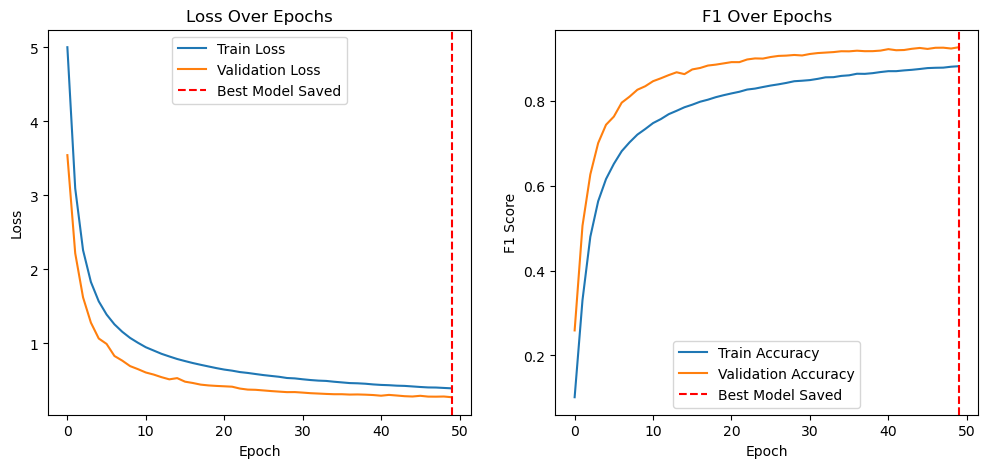

In [55]:
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.axvline(x=best_epoch, color='r', linestyle='--', label='Best Model Saved')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# F1
plt.subplot(1, 2, 2)
plt.plot(train_metrics, label='Train Accuracy')
plt.plot(val_metrics, label='Validation Accuracy')
plt.axvline(x=best_epoch, color='r', linestyle='--', label='Best Model Saved')
plt.title('F1 Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.legend()

plt.show()

### Evaluation

In [56]:
# load model
model.load_state_dict(torch.load('best_model2D.pth'))
model.to(device)

NeuralNet(
  (fc1): Linear(in_features=136, out_features=300, bias=True)
  (bn1): BatchNorm1d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc2): Linear(in_features=300, out_features=490, bias=True)
  (bn2): BatchNorm1d(490, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc3): Linear(in_features=490, out_features=440, bias=True)
  (bn3): BatchNorm1d(440, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc4): Linear(in_features=440, out_features=380, bias=True)
  (bn4): BatchNorm1d(380, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (output_layer): Linear(in_features=380, out_features=828, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.15, inplace=False)
)

In [103]:
# evaluate on test data 
def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    test_loss = 0
    all_test_preds, all_test_labels = [], []
    with torch.no_grad():
        for data in test_loader:
            inputs, labels = to_device(data, device)
            outputs = model(inputs)
            test_loss += criterion(outputs, torch.max(labels, 1)[1]).item()
            _, test_preds = torch.max(outputs, 1)
            all_test_preds.extend(test_preds.cpu().numpy())
            all_test_labels.extend(torch.max(labels, 1)[1].cpu().numpy())

    avg_test_loss = test_loss / len(test_loader)
    test_f1 = f1_score(all_test_labels, all_test_preds, average='weighted')
    classification_report_test = classification_report(all_test_labels, all_test_preds)

    return avg_test_loss, test_f1, classification_report_test

In [104]:
# call a function evaluate_model
test_loss_2d, test_f1_2d, classification_report_2d  = evaluate_model(model, test_loader, criterion, device)
print(f"Test Loss: {test_loss_2d:.6f}, Test F1: {test_f1_2d:.6f}")

Test Loss: 0.267562, Test F1: 0.927554


In [105]:
print(classification_report_2d)

              precision    recall  f1-score   support

           0       0.81      0.93      0.86        41
           1       1.00      1.00      1.00        22
           2       0.94      1.00      0.97        16
           3       1.00      1.00      1.00        74
           4       1.00      0.87      0.93        15
           5       1.00      1.00      1.00        39
           6       0.78      0.75      0.77        24
           7       0.96      0.96      0.96        28
           8       0.81      0.77      0.79        22
           9       0.92      0.89      0.91        27
          10       0.92      0.84      0.88        57
          11       0.97      0.97      0.97        38
          12       0.99      1.00      0.99        72
          13       0.95      0.91      0.93        88
          14       0.93      0.98      0.95        43
          15       0.95      0.90      0.92        40
          16       1.00      0.97      0.98        29
          17       0.99    

# Can the result be improved by using the 3D Landmark Masking?

### Splitting into train, validation and test sets for the 3D landmarking points

In [67]:
X_temp, X_test3D, y_temp, y_test3D = train_test_split(normalizedShapesTable3D, y_encoded, test_size=0.15, random_state=random_state)
X_train3D, X_val3D, y_train3D, y_val3D = train_test_split(X_temp, y_temp, test_size=0.176, random_state=random_state)

print(f"X_train size: {X_train3D.shape}, X_val size: {X_val3D.shape}, X_test size: {X_test3D.shape}")
print(f"y_train size: {y_train3D.shape}, y_val size: {y_val3D.shape}, y_test size: {y_test3D.shape}")

X_train size: (182383, 204), X_val size: (38956, 204), X_test size: (39060, 204)
y_train size: (182383, 828), y_val size: (38956, 828), y_test size: (39060, 828)


In [68]:
X_train3D = torch.tensor(X_train3D, dtype=torch.float32)
X_val3D = torch.tensor(X_val3D, dtype=torch.float32)
X_test3D = torch.tensor(X_test3D, dtype=torch.float32)

y_train3D = torch.tensor(y_train3D, dtype=torch.float32)
y_val3D = torch.tensor(y_val3D, dtype=torch.float32)
y_test3D = torch.tensor(y_test3D, dtype=torch.float32)

### Architecture

In [61]:
class NeuralNet3D(nn.Module):
    def __init__(self):
        super(NeuralNet3D, self).__init__()
        self.fc1 = nn.Linear(X_train3D.shape[1], 400)
        self.bn1 = nn.BatchNorm1d(400)
        self.fc2 = nn.Linear(400, 490)
        self.bn2 = nn.BatchNorm1d(490)
        self.fc3 = nn.Linear(490, 440)
        self.bn3 = nn.BatchNorm1d(440)
        self.fc4 = nn.Linear(440, 380)
        self.bn4 = nn.BatchNorm1d(380)
        self.output_layer = nn.Linear(380, y_train.shape[1])

        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.15)

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.dropout(x)
        x = self.relu(self.bn4(self.fc4(x)))
        x = self.output_layer(x)

        return x

### Create Datasets and Dataloaders

In [69]:
train_dataset3D = CustomDataset(X_train3D, y_train3D)
val_dataset3D = CustomDataset(X_val3D, y_val3D)
test_dataset3D = CustomDataset(X_test3D, y_test3D)

train_loader3D = DataLoader(train_dataset3D, batch_size=64, shuffle=True)
val_loader3D = DataLoader(val_dataset3D, batch_size=64, shuffle=False)
test_loader3D = DataLoader(test_dataset3D, batch_size=64, shuffle=False)

### Parameters

In [70]:
model3D = NeuralNet3D().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model3D.parameters(), lr=0.0001)

### Training

In [71]:
train_losses, val_losses, train_metrics, val_metrics, best_epoch = train_model(model3D, train_loader3D, val_loader3D, criterion, optimizer, save_path='best_model3D.pth', num_epochs=50, patience=10)

Epoch 1, Train Loss: 5.045975697166042, Val Loss: 3.629507853675554, Train F1: 0.09337443824260219, Val F1: 0.24049913665921951
Epoch 2, Train Loss: 3.152688248450296, Val Loss: 2.2795001683368277, Train F1: 0.32098491939147744, Val F1: 0.49102075207804696
Epoch 3, Train Loss: 2.2943804141513087, Val Loss: 1.7059986084357075, Train F1: 0.47246640075454216, Val F1: 0.6078741619811509
Epoch 4, Train Loss: 1.8501852144274795, Val Loss: 1.3198027827078094, Train F1: 0.5616347262721761, Val F1: 0.6895948704068618
Epoch 5, Train Loss: 1.58128894761989, Val Loss: 1.1011533840927976, Train F1: 0.6153042866310112, Val F1: 0.7360419406740941
Epoch 6, Train Loss: 1.397254878972706, Val Loss: 0.9604441018527364, Train F1: 0.6530064417402984, Val F1: 0.770095032003326
Epoch 7, Train Loss: 1.2545713745711142, Val Loss: 0.8383407373537962, Train F1: 0.6837972406489585, Val F1: 0.7918491287000893
Epoch 8, Train Loss: 1.145251393401832, Val Loss: 0.7636287880844279, Train F1: 0.7066651077718884, Val F1

### Learning curves

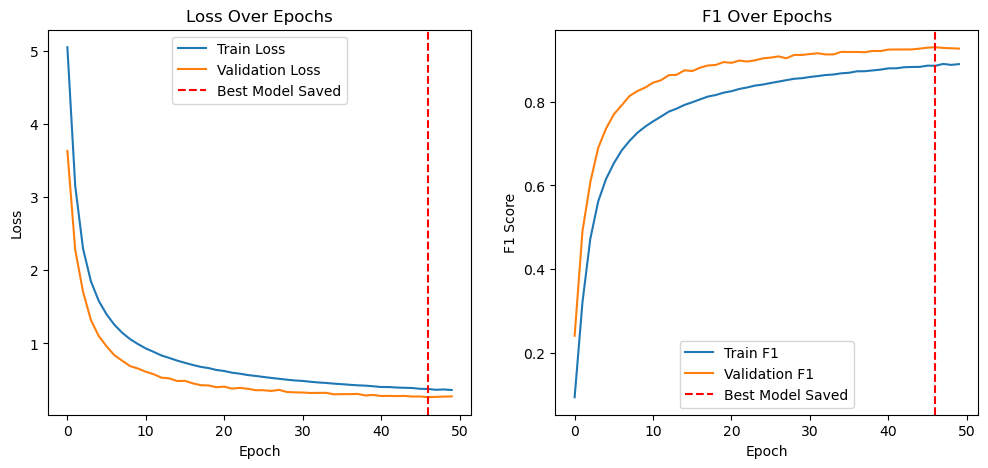

In [72]:
# Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.axvline(x=best_epoch, color='r', linestyle='--', label='Best Model Saved')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# F1
plt.subplot(1, 2, 2)
plt.plot(train_metrics, label='Train F1')
plt.plot(val_metrics, label='Validation F1')
plt.axvline(x=best_epoch, color='r', linestyle='--', label='Best Model Saved')
plt.title('F1 Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.legend()

plt.show()

### Evaluation

In [73]:
# load model
model3D.load_state_dict(torch.load('best_model3D.pth'))
model3D.to(device)

NeuralNet3D(
  (fc1): Linear(in_features=204, out_features=400, bias=True)
  (bn1): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc2): Linear(in_features=400, out_features=490, bias=True)
  (bn2): BatchNorm1d(490, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc3): Linear(in_features=490, out_features=440, bias=True)
  (bn3): BatchNorm1d(440, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc4): Linear(in_features=440, out_features=380, bias=True)
  (bn4): BatchNorm1d(380, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (output_layer): Linear(in_features=380, out_features=828, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.15, inplace=False)
)

In [106]:
test_loss_3d, test_f1_3d, classification_report_3d = evaluate_model(model3D, test_loader3D, criterion, device)
print(f"Test Loss: {test_loss_3d:.6f}, Test F1: {test_f1_3d:.6f}")

Test Loss: 0.271953, Test F1: 0.927557


In [109]:
print(classification_report_3d)

              precision    recall  f1-score   support

           0       0.92      0.88      0.90        41
           1       1.00      1.00      1.00        22
           2       0.89      1.00      0.94        16
           3       1.00      0.97      0.99        74
           4       1.00      0.93      0.97        15
           5       0.93      1.00      0.96        39
           6       0.95      0.75      0.84        24
           7       0.93      0.96      0.95        28
           8       0.82      0.82      0.82        22
           9       0.92      0.89      0.91        27
          10       0.92      0.81      0.86        57
          11       0.97      0.95      0.96        38
          12       1.00      0.99      0.99        72
          13       0.96      0.93      0.95        88
          14       0.98      0.98      0.98        43
          15       0.89      0.80      0.84        40
          16       0.96      0.93      0.95        29
          17       0.91    

# Conlusion about classification

### Display F1 results of the classical models and NNs

In [76]:
# List of all methods used in comparison
modelList=["LR","Desicion Tree","KNN","GNB","Random Forest", "NN2D", "NN3D"]

# Create a list with the scores with each of the methods in this notebook
allScores = [f1LR, f1DTC, f1KNC, f1GNB, f1RFC, test_f1_2d, test_f1_3d]

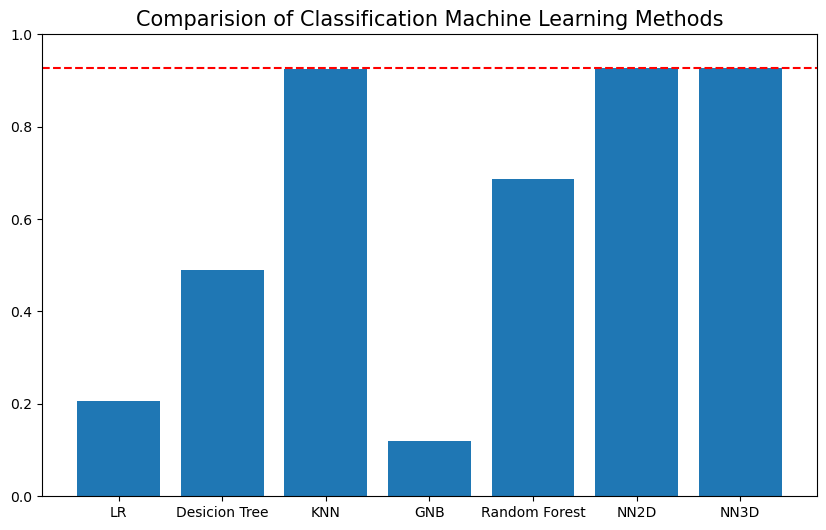

In [84]:
plt.figure(figsize=(10,6))
plt.bar(modelList,allScores)
plt.title('Comparision of Classification Machine Learning Methods', fontsize=15)
plt.axhline(y=max(allScores), linestyle = '--', c='r')
plt.ylim(0,1)
plt.show()

### Visualization

In [85]:
# Function to get images, predictions and labels
def get_predictions(model, test_loader, device):
    model.eval()
    predictions = []
    labels = []
    images = []

    with torch.no_grad():
        for data in test_loader:
            inputs, labels_batch = data
            inputs = inputs.to(device)
            labels_batch = labels_batch.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            predictions.extend(predicted.cpu().numpy())
            labels.extend(labels_batch.cpu().numpy())
            images.extend(inputs.cpu().numpy())

    return images, predictions, labels

images, predictions, labels = get_predictions(model3D, test_loader3D, device)

In [88]:
# Map videoID to personName in videoID
video_to_name = dict(zip(videoDF['videoID'], videoDF['personName']))

# Create a label dict
label_decoder = {label: name.split('_')[0] for label, name in zip(dfExpanded['actualName'].unique(), dfExpanded['videoIDexpanded'].unique())}

# use this dictionary for visualization
def decode_label(label):
    return label_decoder.get(label, "Unknown")

In [89]:
label_decoder = {}
for index, row in dfExpanded.iterrows():
    video_id = row['videoIDexpanded']

    if video_id in video_to_name:
        label_decoder[row['actualName']] = video_to_name[video_id]
    else:
        print(f"No matching found for {video_id}")  # For debugging

In [90]:
label_decoder

{45: 'Alison_Lohman',
 434: 'Kevin_Spacey',
 462: 'Lauren_Hutton',
 710: 'Robert_F_Kennedy_Jr',
 51: 'Amanda_Beard',
 61: 'Andrew_Bernard',
 78: 'Barbara_Brezigar',
 217: 'Daniel_Kurtzer',
 253: 'Elizabeth_Berkeley',
 315: 'Fred_Eckhard',
 347: 'George_W_Bush',
 437: 'Kim_Gandy',
 527: 'Maria_Bello',
 557: 'Mary_Matalin',
 568: 'Narendra_Modi',
 580: 'Newt_Gingrich',
 582: 'Nicanor_Duarte_Frutos',
 597: 'Norm_Macdonald',
 619: 'Paul_Bremer',
 621: 'Paul_Celluci',
 655: 'Phil_Gramm',
 685: 'Ray_Romano',
 700: 'Richard_Rodriguez',
 701: 'Richard_Shelby',
 712: 'Robert_Nardelli',
 744: 'Tara_VanDerveer',
 746: 'Tavis_Smiley',
 10: 'Agbani_Darego',
 11: 'Agnes_Bruckner',
 13: 'Ahmed_Ahmed',
 14: 'Aidan_Quinn',
 15: 'Aishwarya_Rai',
 30: 'Aleksander_Kwasniewski',
 42: 'Ali_Abbas',
 44: 'Alicia_Silverstone',
 48: 'Alma_Powell',
 49: 'Alvaro_Silva_Calderon',
 54: 'Amelia_Vega',
 76: 'Barbara_Bodine',
 79: 'Barbara_Walters',
 81: 'Barry_Alvarez',
 90: 'Ben_Stein',
 94: 'Benjamin_Netanyahu',
 1

In [91]:
def visualize_results(df, predictions, fullPaths, label_decoder, num_examples=10):
    # predictions is a list/array of predicted labels (numbers)
    correct_indices = [i for i, (pred, actual) in enumerate(zip(predictions, df['actualName'])) if pred == actual]

    # Random selection of indexes for demonstration
    selected_correct = np.random.choice(correct_indices, num_examples, replace=False)

    num_cols = int(num_examples/2)
    # Visualization
    fig, axs = plt.subplots(2, num_cols, figsize=(15, 6))
    axs = axs.flatten()

    for i, idx in enumerate(selected_correct):
        row = df.iloc[idx]
        video_file = np.load(fullPaths[row['videoIDexpanded']])
        image = video_file['colorImages'][:,:,:,row['frameNum']]
        plt.suptitle('Correctly detected people', fontsize=25)
        axs[i].imshow(image)
        axs[i].set_title(f"Correct: {label_decoder[predictions[idx]]}")
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

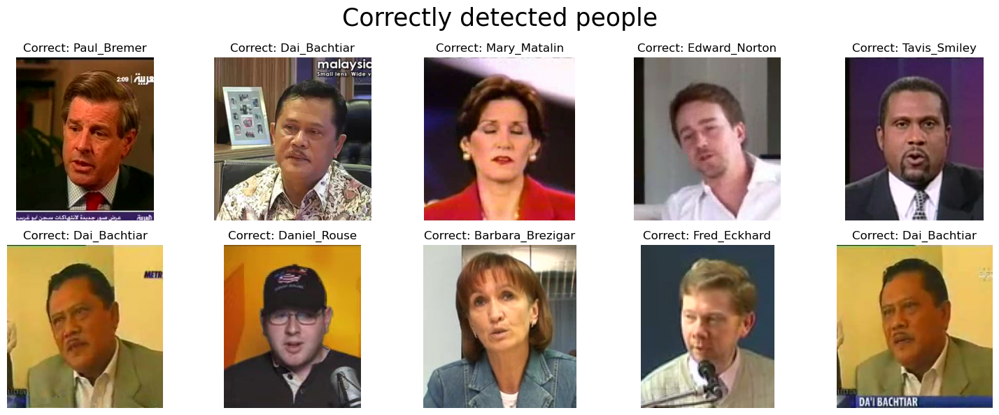

In [92]:
visualize_results(dfExpanded, predictions, fullPaths, label_decoder)

In [95]:
def visualize_classification_errors(df, predictions, fullPaths, label_decoder, num_examples=5):
    incorrect_indices = [i for i, (pred, actual) in enumerate(zip(predictions, df['actualName'])) if pred != actual]
    selected_incorrect = np.random.choice(incorrect_indices, num_examples, replace=False)

    fig, axs = plt.subplots(2, num_examples, figsize=(20, 10))  # Create a grid of 2 rows

    for i, idx in enumerate(selected_incorrect):
        row = df.iloc[idx]
        actual_person_name = label_decoder[row['actualName']]
        predicted_person_name = label_decoder[predictions[idx]]

        # Upload and display an image of the person with whom the error occurred (predicted)
        predicted_image_index = df[df['actualName'] == predictions[idx]].sample(1).index.item()
        predicted_row = df.loc[predicted_image_index]
        predicted_image_path = fullPaths[predicted_row['videoIDexpanded']]
        predicted_image = np.load(predicted_image_path)['colorImages'][:,:,:,predicted_row['frameNum']]
        axs[0, i].imshow(predicted_image)
        axs[0, i].set_title(f"Predicted: {predicted_person_name}")
        axs[0, i].axis('off')

        # Load and display the correct image (true)
        correct_image_path = fullPaths[row['videoIDexpanded']]
        correct_image = np.load(correct_image_path)['colorImages'][:,:,:,row['frameNum']]
        plt.suptitle('Wrongly detected people', fontsize=25)
        axs[1, i].imshow(correct_image)
        axs[1, i].set_title(f"Correct: {actual_person_name}")
        axs[1, i].axis('off')

    # plt.tight_layout()
    plt.show()

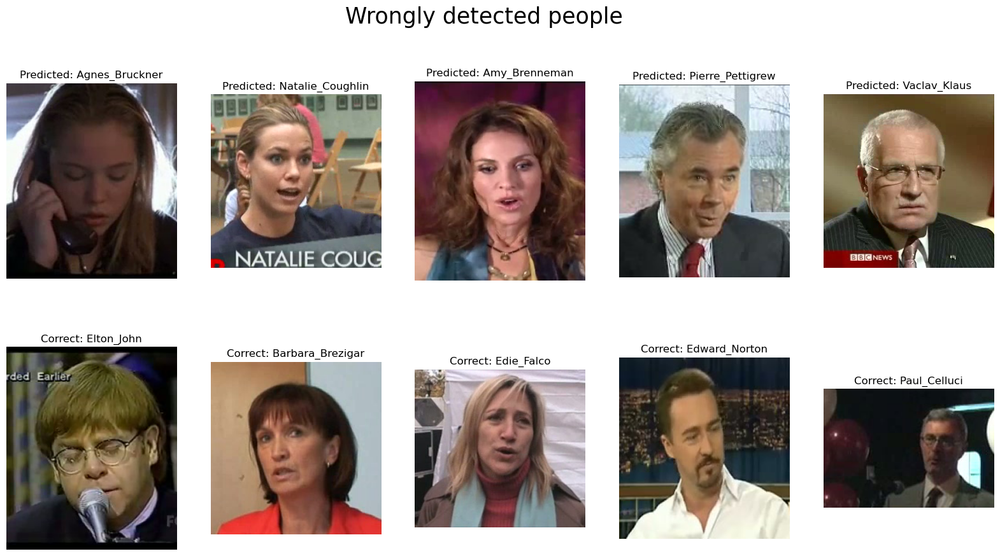

In [96]:
visualize_classification_errors(dfExpanded, predictions, fullPaths, label_decoder)

### So, multi-level perceptron on 3D Landmarks turned out to be the best performing model along with same model on 2D Landmarks. And KNN is also really good.